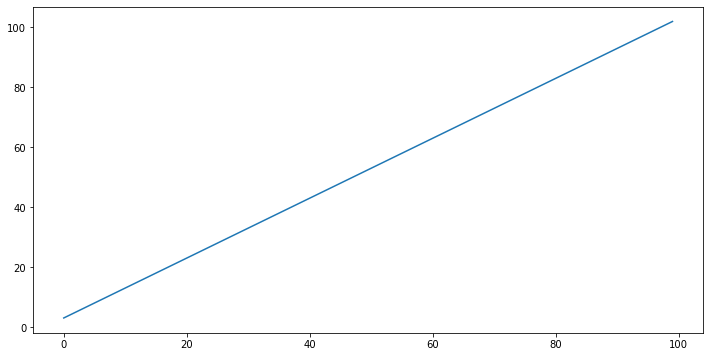

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

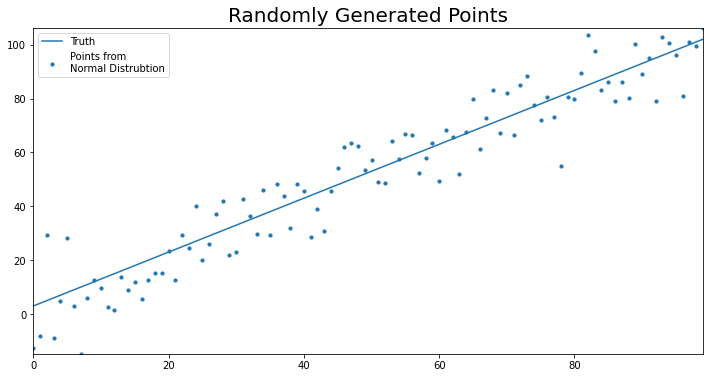

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

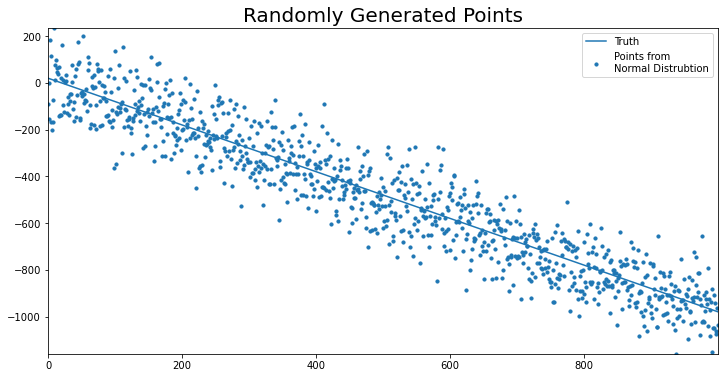

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

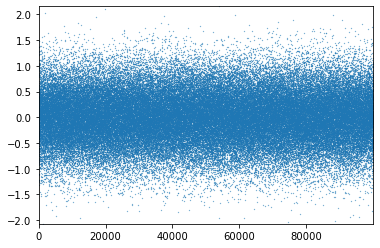

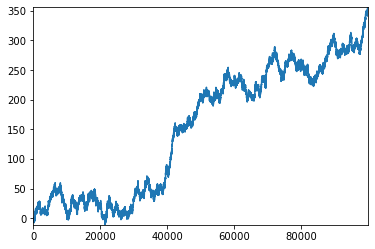

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()


In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)


In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-1.557773,0.572681,-1.669141,-0.049726,2.263541,0.005093,0.568056,-0.862974,0.719114,-1.552004,...,0.374522,-0.189916,-0.296166,0.405197,0.569814,1.420786,-0.378907,0.740718,0.604755,-1.144707
1,0.851831,1.002687,-1.213962,0.110500,0.922050,0.431832,0.305546,0.363545,0.683217,-0.389323,...,-0.020533,-0.585462,-1.013165,-0.270509,0.187179,-1.036497,-0.043099,-0.611530,0.306910,0.941412
2,0.178687,1.066040,-0.841551,-0.120757,0.425549,-1.065851,-0.619098,-0.531874,1.032242,-1.672700,...,-0.479415,-1.416107,-0.394689,-2.091375,1.289372,0.676495,0.851098,-0.478045,-1.089529,1.822199
3,-0.337949,1.554549,-1.134741,-1.008889,-0.606663,0.913217,-0.524678,0.508871,-0.333134,-0.892909,...,-0.210161,-0.339343,-0.614768,0.607388,0.819455,-0.738390,1.477805,1.386822,2.002114,-0.147401
4,0.485490,-1.087150,0.150015,-1.460997,-0.281647,-0.428790,0.179644,-0.061086,-0.266068,-2.534488,...,-1.132727,-1.551954,2.043251,0.796557,0.474036,0.560677,1.172899,-0.610253,-0.979820,0.052152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1.135804,-1.009544,-0.859714,-0.090937,0.121780,-0.182395,-0.085590,-0.193881,-1.617548,0.213188,...,0.238343,1.257143,-0.658095,0.781561,-1.268081,1.755905,-1.119757,-0.511702,-0.400034,0.292963
1996,0.158852,0.688579,-0.521366,1.792893,-0.701634,-2.237894,0.462934,-1.390052,-0.881947,0.410727,...,-1.922074,-1.889395,0.849078,0.321480,0.677623,-1.346477,-1.273160,1.385843,-1.398395,0.284125
1997,0.068408,-0.959266,-0.526363,1.193965,0.099249,-1.382822,0.643263,-0.188649,0.983363,-0.014446,...,1.514623,0.092913,-0.392520,-0.778172,1.202428,0.655588,0.421334,-1.463233,0.482069,-0.402830
1998,2.100266,0.182965,0.955691,1.172583,0.712270,-1.984316,-0.753135,0.930882,0.619120,0.519978,...,-2.204887,0.865744,0.868468,0.480746,-0.698576,-0.921589,-0.387170,0.940103,-1.384212,-0.246553


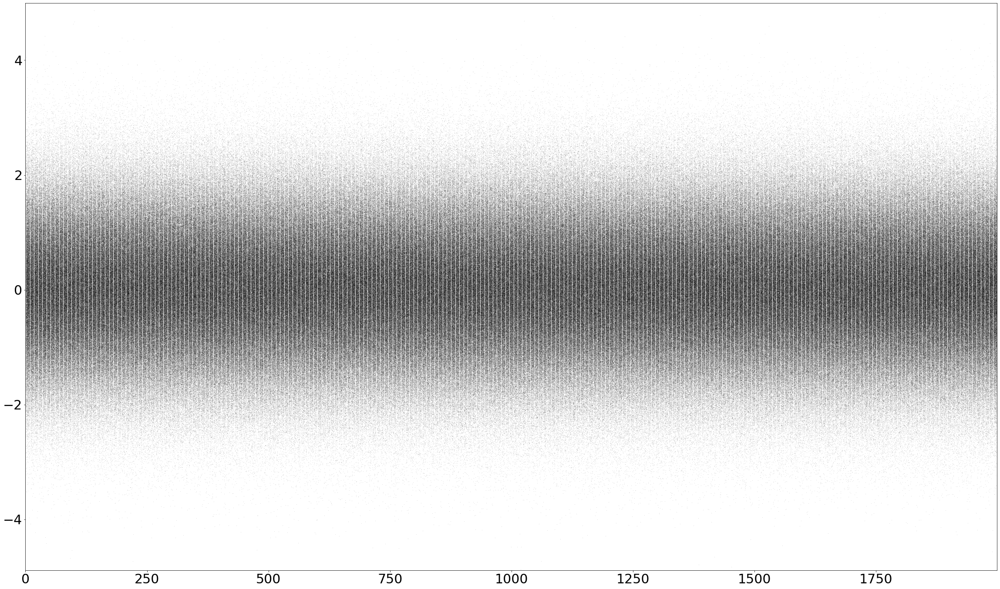

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

C:\Users\faria\AppData\Local\Temp/ipykernel_12352/667913757.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


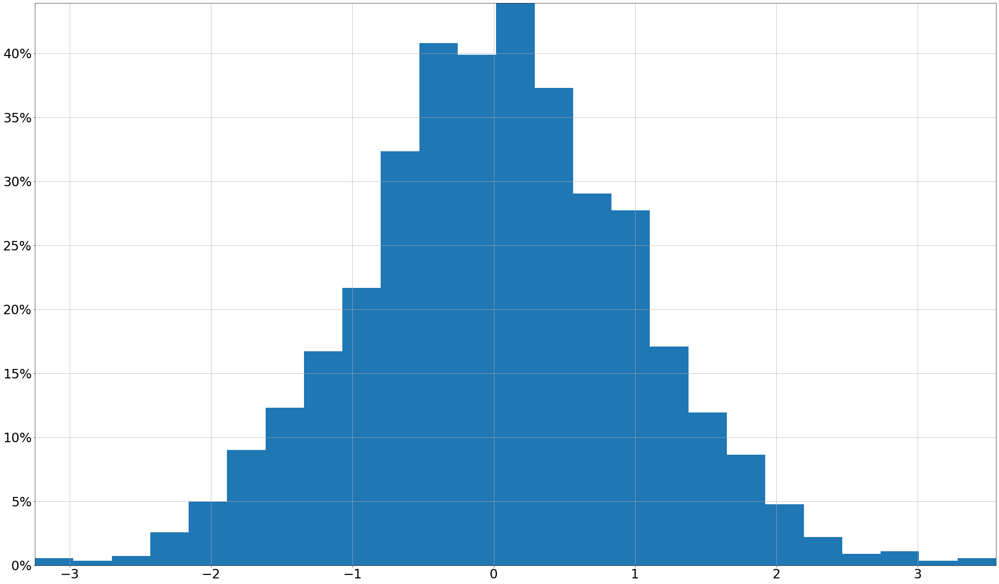

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = .05 #play around with the parameters
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
pd.DataFrame

pandas.core.frame.DataFrame

In [10]:
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum() 
#we are gonna take cumulative sum
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.080380,-0.321066,0.562110,0.163870,0.754380,0.142990,0.095247,-0.222570,-0.189571,0.243542,...,0.859301,-0.185624,-0.761619,0.410606,0.549517,0.970307,-0.316525,0.593414,0.034402,-0.757653
1,-1.270445,-0.538936,1.292587,0.159480,0.304128,-0.651120,0.006353,-0.493314,0.981645,-0.518915,...,0.700160,0.313891,-0.420228,1.499670,0.265944,1.660467,0.868587,-0.005802,-0.078091,-0.373297
2,-1.071059,0.046190,0.791106,0.042205,0.149631,-0.060645,-0.181252,-0.904352,0.331738,-0.133148,...,1.425462,0.546128,0.570604,1.054223,0.679931,1.100427,1.129377,-0.607073,-0.197273,0.030264
3,-0.582329,0.610206,0.597447,0.472470,-0.238756,-1.121373,-0.423939,-0.889531,0.371250,-0.740700,...,0.786196,0.214912,0.556080,0.934114,0.066445,1.348049,1.250890,-0.820267,-0.449131,-0.040546
4,-0.249430,0.534986,0.156473,0.892226,-0.553737,-0.721502,0.137409,0.142141,0.400703,0.711364,...,0.791086,0.326105,1.223705,1.411633,-0.372133,1.848896,0.963887,-0.700625,0.023008,0.297531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,86.175399,117.666042,84.733481,129.911041,86.894246,98.806185,85.321547,105.651877,78.759910,97.323108,...,147.897228,127.467787,82.590627,69.033279,140.909830,110.925789,89.407583,116.334730,88.071008,105.610388
1996,86.423131,118.373262,84.561848,129.105351,87.627529,98.082993,85.605991,106.287622,79.189571,97.305882,...,147.254195,127.379642,82.534754,68.612314,140.361178,111.075107,89.722893,116.339246,88.123545,106.070461
1997,85.714910,118.491079,84.810521,130.155792,87.456184,97.127561,84.639022,105.535653,79.656310,97.518470,...,147.293822,127.048629,82.633486,68.577497,140.805175,111.426855,90.567494,116.972926,87.911867,105.504433
1998,85.884433,118.314364,84.939808,130.439134,87.865514,97.332863,84.275951,105.632585,79.176961,98.247989,...,147.199135,127.277962,81.436338,69.035662,141.721388,110.922967,91.323321,117.257624,87.436340,105.457007


First few rows of both dataframes are same.

In [11]:
def plot_monte_carlo_sim(sim_data,  
                         title = None, 
                         logy = True):
    
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    #plot all the observations except for mean
    #experiment with the parameters
    
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    sim_data["mean"].plot.line(legend = False, color = "C3", linewidth = 5, logy = logy, ax = ax)
    index = list(sim_data.index) 
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()
    
    #try changing the alphas to see the difference in outcomes

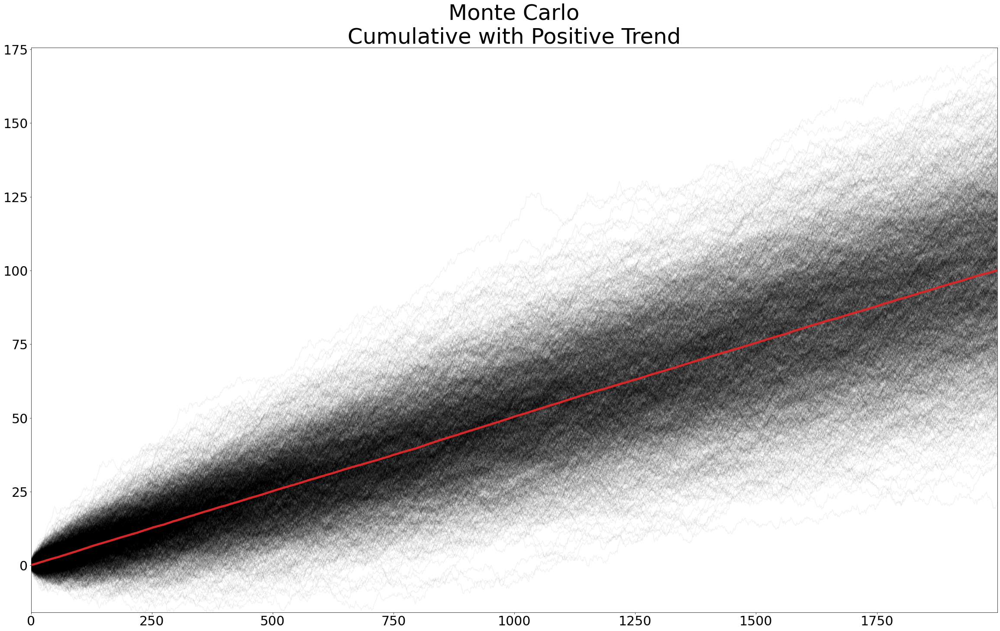

In [12]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
                    title = "Monte Carlo\nCumulative with Positive Trend", 
                    logy = False)


## Calculating Expected Value

In [13]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0         0.068884
1         0.113791
2         0.159522
3         0.222101
4         0.275188
           ...    
1995     99.865250
1996     99.902661
1997     99.958723
1998     99.992903
1999    100.033373
Name: mean, Length: 2000, dtype: float64

## Simulating Changes in Portfolio Values

In [14]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)
data_dict

{'MSFT':                   High         Low        Open       Close       Volume  \
 Date                                                                      
 2005-01-03   26.950001   26.650000   26.799999   26.740000   65002900.0   
 2005-01-04   27.100000   26.660000   26.870001   26.840000  109442100.0   
 2005-01-05   27.100000   26.760000   26.840000   26.780001   72463500.0   
 2005-01-06   27.059999   26.639999   26.850000   26.750000   76890500.0   
 2005-01-07   26.889999   26.620001   26.820000   26.670000   68723300.0   
 ...                ...         ...         ...         ...          ...   
 2021-11-26  337.929993  328.119995  334.350006  329.679993   24217200.0   
 2021-11-29  339.029999  334.739990  334.940002  336.630005   28563500.0   
 2021-11-30  337.779999  328.989990  335.320007  330.589996   42885600.0   
 2021-12-01  339.279999  329.390015  335.130005  330.079987   33337600.0   
 2021-12-02  333.470001  327.820007  330.299988  330.674500    9658179.0   
 
  

In [15]:
# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [16]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change
#this is the percent change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-11-26,-0.024356,-0.031678,-0.007881,-0.026660
2021-11-29,0.021081,0.021874,0.023228,0.023164
2021-11-30,-0.017943,0.031578,-0.011814,-0.025063


In [17]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-11-26,12.329095,138.747925,1.239256,28.284993
2021-11-29,12.589006,141.782849,1.268041,28.940194
2021-11-30,12.363126,146.260014,1.253060,28.214877


IBM had a less than steller outcome.
Apple did great.

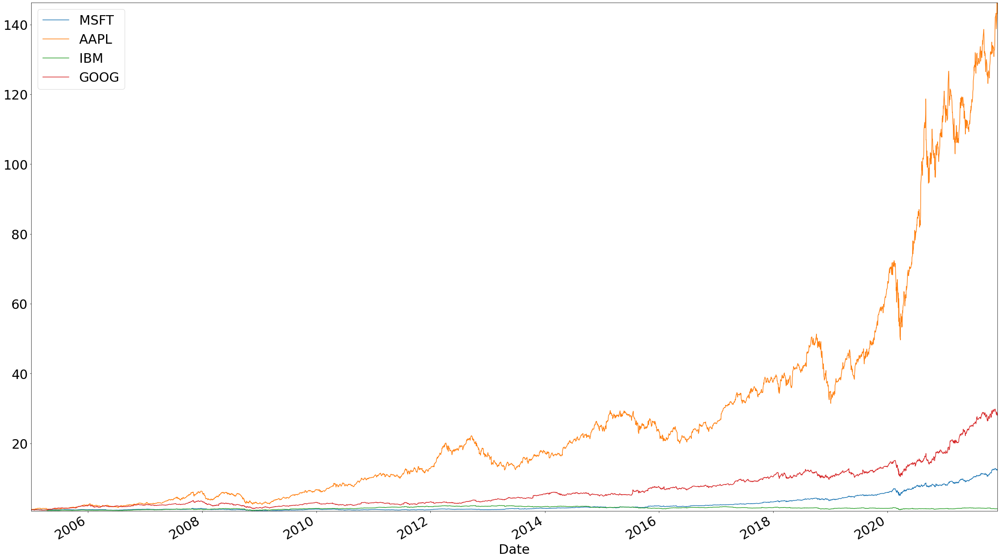

In [18]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(
                                ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [22]:
## we will calculate mean using this equation

mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000591,0.017055
AAPL,0.001166,0.020771
IBM,0.000054,0.014585
GOOG,0.000787,0.018617


In [23]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [25]:
monte_carlo_sim_dfs

{'MSFT':                   0         1         2          3         4          5    \
 2005-01-03   0.979760  0.999363  0.973588   0.996504  1.009144   1.027639   
 2005-01-04   0.969110  0.987446  0.989473   1.021388  0.959877   1.031033   
 2005-01-05   1.003626  0.983859  0.978885   1.049062  0.968627   1.061439   
 2005-01-06   1.001892  0.987695  0.989305   1.071333  0.979839   1.093524   
 2005-01-07   0.993410  0.990600  0.999519   1.072408  0.961172   1.110119   
 ...               ...       ...       ...        ...       ...        ...   
 2021-11-26  11.635790  4.192860  7.360762  12.457505  1.505108  11.486044   
 2021-11-29  11.865024  4.152525  7.326516  12.516180  1.513320  11.524896   
 2021-11-30  11.707055  4.099759  7.428803  12.455752  1.469709  11.640091   
 2021-12-01  11.844212  4.161609  7.395070  12.666899  1.487682  11.580825   
 2021-12-02  11.700348  4.097901  7.506774  12.542792  1.485882  11.795025   
 
                   6         7          8         9   

In [26]:
def plot_monte_carlo_sim(sim_data, observed_data = None, title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, color = "C2", linewidth = 5, logy = logy, ax = ax)
    
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C2")
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [27]:
monte_carlo_sim_dfs[stock].median(axis = 1)

2005-01-03     0.999904
2005-01-04     0.999971
2005-01-05     1.000051
2005-01-06     1.001612
2005-01-07     1.003346
                ...    
2021-11-26    13.269323
2021-11-29    13.323842
2021-11-30    13.319381
2021-12-01    13.530231
2021-12-02    13.565634
Length: 4260, dtype: float64

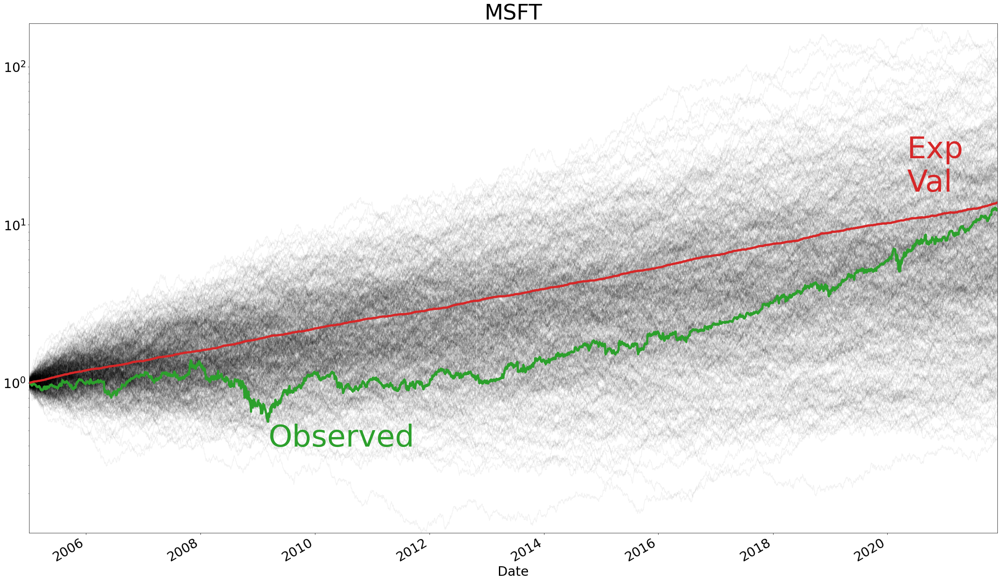

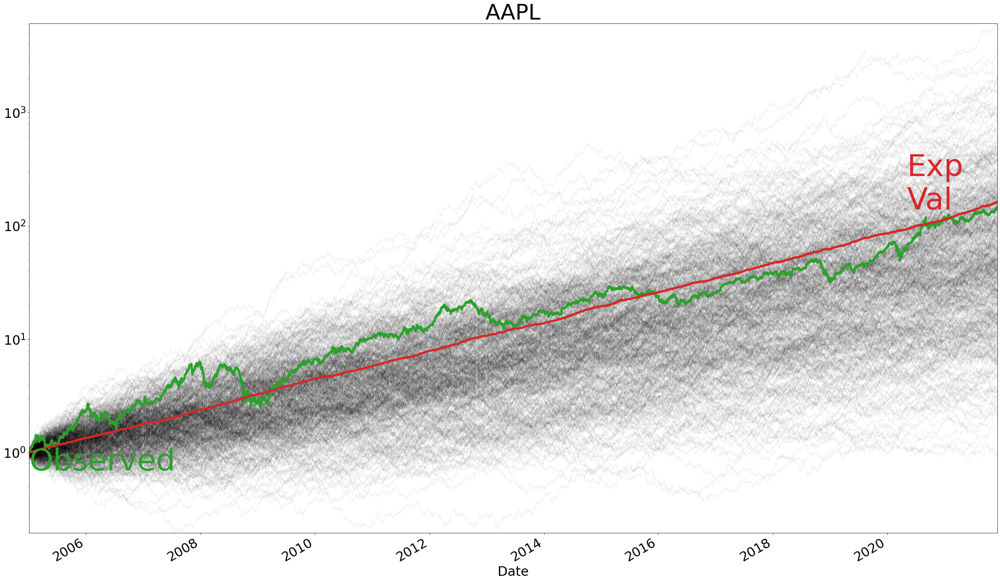

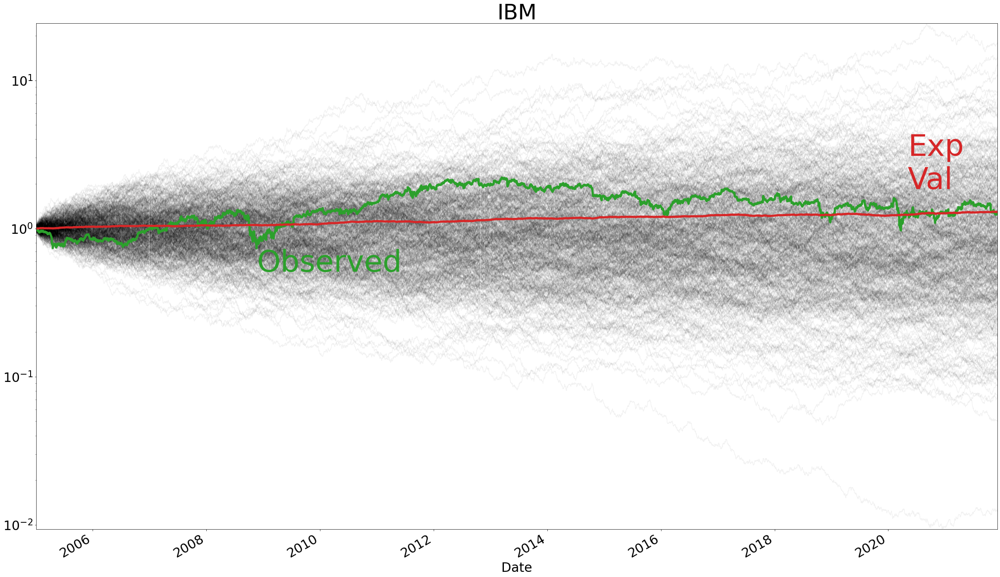

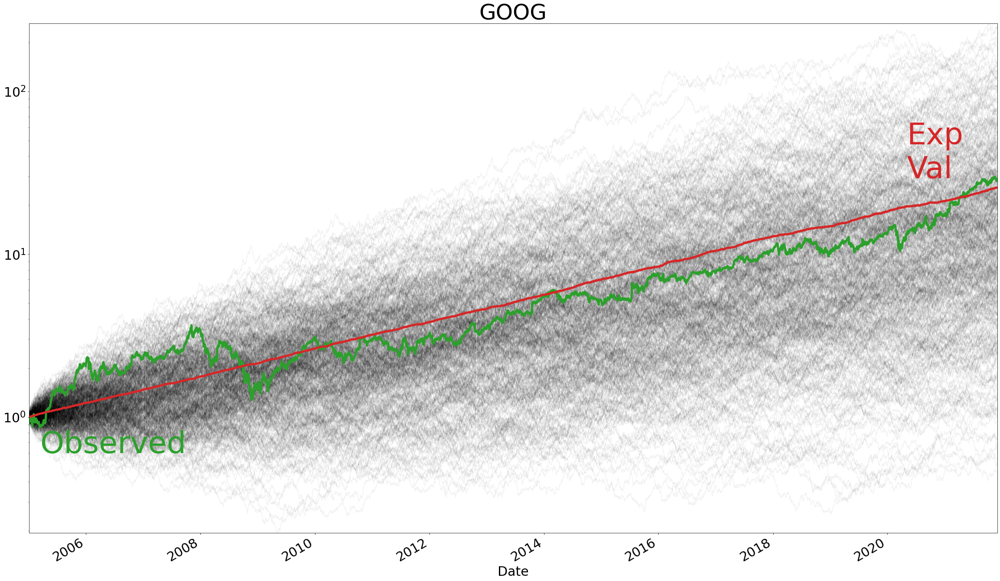

In [28]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], close_data_normalized[stock], stock, logy= True)


## Calculate Portfolio Return

In [29]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [30]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]), axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2021-11-26,12.329095,138.747925,1.239256,28.284993,45.150317
2021-11-29,12.589006,141.782849,1.268041,28.940194,46.145023
2021-11-30,12.363126,146.260014,1.253060,28.214877,47.022769


<AxesSubplot:xlabel='Date'>

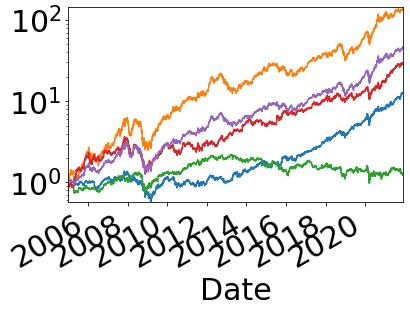

In [31]:
close_data_normalized.plot.line(legend=False, logy = True)

In [32]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001298
...,...
2021-11-26,-0.030239
2021-11-29,0.022031
2021-11-30,0.019021


In [33]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) **(1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000901,0.016471


In [34]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, dates)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,0.961332,0.997673,1.018850,1.011803,1.025177,0.965923,1.002880,1.028403,0.994391,0.985955,...,1.035445,0.974148,0.996985,1.030951,0.981327,1.014402,1.002419,0.989366,1.009722,1.013628
2005-01-04,0.990171,1.008799,1.004198,1.015641,1.043792,0.944717,1.003535,1.032352,0.982959,0.990532,...,1.050593,0.998587,1.014785,1.008513,1.000018,1.007682,1.007355,0.975375,1.012170,1.022965
2005-01-05,0.981734,0.990208,1.000260,1.020169,1.054187,0.917708,1.008559,1.058310,0.988575,0.990069,...,1.061158,1.014813,1.026873,0.968156,0.997580,0.986770,1.008046,0.974763,1.024988,0.994999
2005-01-06,0.986270,0.992403,1.000949,1.020219,1.031494,0.954186,0.966454,1.067485,0.969341,0.980209,...,1.007316,1.003473,1.034767,0.934596,0.992726,0.985611,1.003797,0.981591,1.007511,1.003581
2005-01-07,0.944580,1.013065,0.980397,1.026967,1.015783,0.949592,0.964615,1.088148,0.975995,0.979240,...,1.039114,1.008348,1.012864,0.916785,1.012961,0.979898,0.991199,0.988410,1.023896,0.986255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,48.122841,8.060886,9.960685,7.973568,62.748312,70.161170,38.923205,7.379695,21.355270,60.396753,...,47.098901,7.901124,26.944626,162.010470,7.168953,15.522939,34.016517,50.682929,28.989968,48.001096
2021-11-29,48.721912,8.209762,10.048294,7.714083,62.653227,71.055518,39.293428,7.313481,21.152912,60.433405,...,48.166411,7.991030,27.311864,153.311119,7.162542,15.695835,33.383991,51.418841,28.648640,48.776452
2021-11-30,48.671520,8.523705,10.151348,7.835109,60.146117,70.052307,40.312999,7.246774,21.265673,60.750097,...,48.196958,7.957425,27.742588,149.823152,6.966641,15.653879,33.229970,51.372544,29.221673,48.493966
2021-12-01,49.126934,8.518371,10.491825,7.681111,61.050725,70.493264,41.115248,7.187869,21.247221,61.025318,...,48.412164,7.899750,27.403771,153.086826,6.996627,15.759862,34.275606,51.427016,28.814992,48.559908


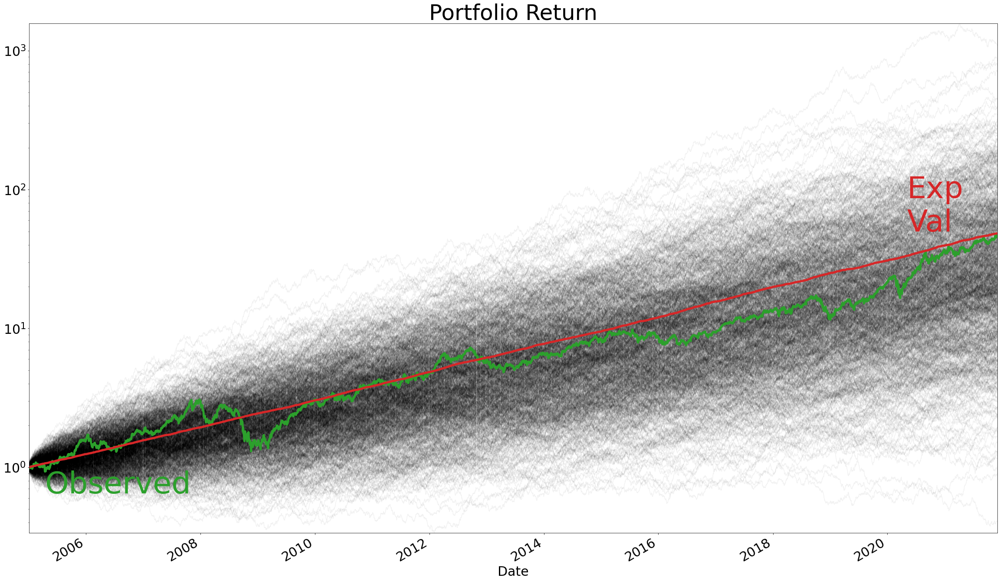

In [35]:
plot_monte_carlo_sim(monte_carlo_sim_df, ex_return["Portfolio Return"], "Portfolio Return", logy= True)